In [1]:
!pip install geopandas matplotlib


     ---------------------------------------- 0.0/51.5 kB ? eta -:--:--
     ---------------------------------------- 0.0/51.5 kB ? eta -:--:--
     ------- -------------------------------- 10.2/51.5 kB ? eta -:--:--
     --------------- ---------------------- 20.5/51.5 kB 320.0 kB/s eta 0:00:01
     ------------------------------ ------- 41.0/51.5 kB 388.9 kB/s eta 0:00:01
     -------------------------------------- 51.5/51.5 kB 375.4 kB/s eta 0:00:00
   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   - -------------------------------------- 0.0/1.1 MB 495.5 kB/s eta 0:00:03
   -- ------------------------------------- 0.1/1.1 MB 656.4 kB/s eta 0:00:02
   --- ------------------------------------ 0.1/1.1 MB 525.1 kB/s eta 0:00:02
   ---- ----------------------------------- 0.1/1.1 MB 602.4 kB/s eta 0:00:02
   ------ --------------------------------- 0.2/1.1 MB 655.4 kB/s eta 0:00:02
   ------- ----

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.

[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: C:\Users\DELL\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [2]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point


In [4]:
!pip install folium

   ---------------------------------------- 0.0/100.0 kB ? eta -:--:--
   --------------- ----------------------- 41.0/100.0 kB 960.0 kB/s eta 0:00:01
   ---------------------------------------- 100.0/100.0 kB 1.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/82.0 kB ? eta -:--:--
   ---------------------------------------- 82.0/82.0 kB 2.3 MB/s eta 0:00:00



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: C:\Users\DELL\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Data loaded successfully. Here's a preview:
               id         TAG  \
0  ParkingAreas.1  ParkingLot   
1  ParkingAreas.2  ParkingLot   
2  ParkingAreas.3  ParkingLot   
3  ParkingAreas.4  ParkingLot   
4  ParkingAreas.5  ParkingLot   

                                            geometry  
0  MULTIPOLYGON (((3094710.710 1426164.688, 30947...  
1  MULTIPOLYGON (((3094998.360 1425993.805, 30949...  
2  MULTIPOLYGON (((3094712.846 1413014.679, 30946...  
3  MULTIPOLYGON (((3094717.669 1426556.901, 30947...  
4  MULTIPOLYGON (((3095974.785 1427316.744, 30959...  
Geometries simplified for better performance.


<Figure size 5000x5000 with 0 Axes>

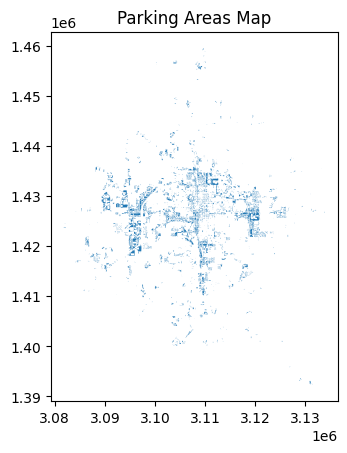

In [10]:
import geopandas as gpd
import matplotlib.pyplot as plt

def load_and_visualize(file_path):
    # Load the GeoJSON file
    gdf = gpd.read_file(file_path)
    print("Data loaded successfully. Here's a preview:")
    print(gdf.head())

    # Simplify geometries to improve performance if the file is very large
    # Adjust the tolerance parameter as necessary
    gdf['geometry'] = gdf['geometry'].simplify(tolerance=0.0001)
    print("Geometries simplified for better performance.")

    # Plotting the data
    plt.figure(figsize=(50, 50))
    gdf.plot()
    plt.title('Parking Areas Map')
    plt.show()

file_path = 'C:\\Users\\DELL\\OneDrive\\Desktop\\CSC3356_Project3\\parking-areas-gis-data-geojson-4.geojson'
load_and_visualize(file_path)


In [6]:
import geopandas as gpd

def analyze_parking_shapes(file_path):
    # Load the GeoJSON file
    gdf = gpd.read_file(file_path)
    print("Data loaded successfully. Here's a preview:")
    print(gdf.head())

    # Get the geometry types
    geometry_types = gdf.geometry.type
    print("Geometry types in the dataset:")
    print(geometry_types.value_counts())

    return geometry_types.value_counts()

# Replace 'path_to_file.geojson' with the path to your GeoJSON file
file_path = 'C:\\Users\\DELL\\OneDrive\\Desktop\\CSC3356_Project3\\parking-areas-gis-data-geojson-4.geojson'
shapes_summary = analyze_parking_shapes(file_path)
print(shapes_summary)


Data loaded successfully. Here's a preview:
               id         TAG  \
0  ParkingAreas.1  ParkingLot   
1  ParkingAreas.2  ParkingLot   
2  ParkingAreas.3  ParkingLot   
3  ParkingAreas.4  ParkingLot   
4  ParkingAreas.5  ParkingLot   

                                            geometry  
0  MULTIPOLYGON (((3094710.710 1426164.688, 30947...  
1  MULTIPOLYGON (((3094998.360 1425993.805, 30949...  
2  MULTIPOLYGON (((3094712.846 1413014.679, 30946...  
3  MULTIPOLYGON (((3094717.669 1426556.901, 30947...  
4  MULTIPOLYGON (((3095974.785 1427316.744, 30959...  
Geometry types in the dataset:
MultiPolygon    3606
dtype: int64
MultiPolygon    3606
dtype: int64


In [5]:
import geopandas as gpd
import folium

def load_and_visualize(file_path):
    # Load the GeoJSON file
    gdf = gpd.read_file(file_path)
    print("Data loaded successfully. Here's a preview:")
    print(gdf.head())

    # Check for invalid geometries and attempt to fix them
    invalid = gdf.is_valid == False
    if invalid.any():
        print(f"Found {invalid.sum()} invalid geometries. Attempting to fix...")
        gdf.loc[invalid, 'geometry'] = gdf.loc[invalid, 'geometry'].buffer(0)

    # Simplify geometries to improve performance if the file is very large
    try:
        gdf['geometry'] = gdf['geometry'].simplify(tolerance=0.001, preserve_topology=True)
        print("Geometries simplified for better performance.")
    except Exception as e:
        print(f"Error during simplification: {e}")

    # Create a Folium map centered on Bloomington, Indiana
    bloomington_coords = [39.1653, -86.5264]  # Latitude and Longitude of Bloomington
    map = folium.Map(location=bloomington_coords, zoom_start=13)
    folium.GeoJson(gdf, name='Parking Areas').add_to(map)
    folium.LayerControl().add_to(map)

    return map


file_path = 'C:\\Users\\DELL\\OneDrive\\Desktop\\CSC3356_Project3\\parking-areas-gis-data-geojson-4.geojson'
map_display = load_and_visualize(file_path)
map_display.save('parking_areas_map.html')  # Save the map to an HTML file
map_display  # Display the map if running in a Jupyter notebook environment


Data loaded successfully. Here's a preview:
               id         TAG  \
0  ParkingAreas.1  ParkingLot   
1  ParkingAreas.2  ParkingLot   
2  ParkingAreas.3  ParkingLot   
3  ParkingAreas.4  ParkingLot   
4  ParkingAreas.5  ParkingLot   

                                            geometry  
0  MULTIPOLYGON (((3094710.710 1426164.688, 30947...  
1  MULTIPOLYGON (((3094998.360 1425993.805, 30949...  
2  MULTIPOLYGON (((3094712.846 1413014.679, 30946...  
3  MULTIPOLYGON (((3094717.669 1426556.901, 30947...  
4  MULTIPOLYGON (((3095974.785 1427316.744, 30959...  
Found 19 invalid geometries. Attempting to fix...
Geometries simplified for better performance.


Data loaded successfully. Here's a preview:
               id         TAG  \
0  ParkingAreas.1  ParkingLot   
1  ParkingAreas.2  ParkingLot   
2  ParkingAreas.3  ParkingLot   
3  ParkingAreas.4  ParkingLot   
4  ParkingAreas.5  ParkingLot   

                                            geometry  
0  MULTIPOLYGON (((3094710.710 1426164.688, 30947...  
1  MULTIPOLYGON (((3094998.360 1425993.805, 30949...  
2  MULTIPOLYGON (((3094712.846 1413014.679, 30946...  
3  MULTIPOLYGON (((3094717.669 1426556.901, 30947...  
4  MULTIPOLYGON (((3095974.785 1427316.744, 30959...  
Found 19 invalid geometries. Attempting to fix...
Geometries simplified for better performance.


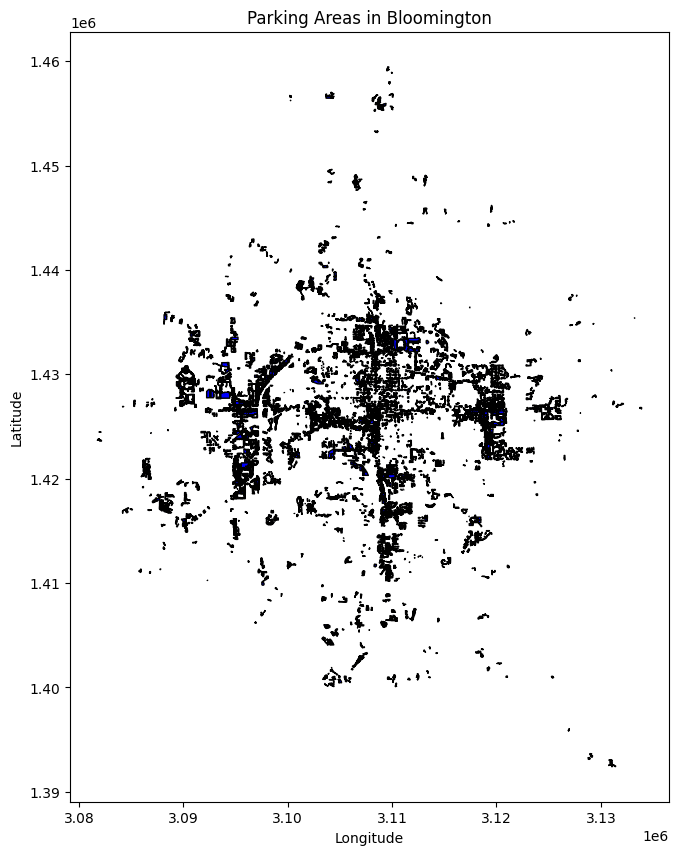

In [11]:
import geopandas as gpd
import matplotlib.pyplot as plt

def load_and_visualize_static(file_path):
    # Load the GeoJSON file
    gdf = gpd.read_file(file_path)
    print("Data loaded successfully. Here's a preview:")
    print(gdf.head())

    # Check for invalid geometries and attempt to fix them
    invalid = gdf.is_valid == False
    if invalid.any():
        print(f"Found {invalid.sum()} invalid geometries. Attempting to fix...")
        gdf.loc[invalid, 'geometry'] = gdf.loc[invalid, 'geometry'].buffer(0)

    # Simplify geometries to improve performance if the file is very large
    try:
        gdf['geometry'] = gdf['geometry'].simplify(tolerance=0.001, preserve_topology=True)
        print("Geometries simplified for better performance.")
    except Exception as e:
        print(f"Error during simplification: {e}")

    # Plotting using matplotlib
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    gdf.plot(ax=ax, color='blue', edgecolor='black')
    ax.set_title('Parking Areas in Bloomington')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()

# Usage example
file_path = 'C:\\Users\\DELL\\OneDrive\\Desktop\\CSC3356_Project3\\parking-areas-gis-data-geojson-4.geojson'
load_and_visualize_static(file_path)
